# Show and Tell - attention based model - INFERENCE
## Trained - now reload checkpoint folder and do inference

### Based on link: https://www.tensorflow.org/tutorials/text/image_captioning

### The model architecture is similar to Show, Attend and Tell: Neural Image Caption Generation with Visual Attention.
#### Arch paper: https://arxiv.org/abs/1502.03044

# Trained model already on 100k images of Coco 2017 Train dataset.
## Loading trained model and doing inference on new images not used in training

## Weights file is useless - MUST restore the checkpoint files and use them to reload model

In [55]:
import os
import sys
import json
import time
import datetime
import string
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
import time
import tensorflow as tf
from tensorflow import keras
import re
import pickle
from glob import glob
import collections
import random
import PIL
import shutil

import matplotlib.pyplot as plt
#from IPython.display import display as ipy_display

In [2]:
## Local versions

## to make deterministic
IPDIR_DETERMINISTIC_ATTEND = r'/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Code/ModelsRuns/ImgCapAttention/SavedData/Thesis_ImgCapATTENTION_Deterministic_Run4/'

## new images - unseen during testing - part of Coco 2017 Test dataset
DEMO_IMGS_DIR = r'/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_train2017_118k/'

## checkpoint dir for the inference
CHKPT_DIR_OUT = '/home/rohit/PyWDUbuntu/thesis/ImgCapATTEND_opdir_DUMMY_RUN/chkPointDir_DUMMY_RUN/train_DUMMY_RUN/'

## checkpoint dir with files saved after training completed - used as input
CHKPTS_IN_DIR = '/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Code/ModelsRuns/ImgCapAttention/SavedData/Thesis_ImgCapATTENTION_ChkPts_In_Run4_Ep21/'

# Model
### Fun fact: the decoder below is identical to the one in the example for Neural Machine Translation with Attention (https://www.tensorflow.org/tutorials/sequences/nmt_with_attention).

### The model architecture is inspired by the Show, Attend and Tell paper (https://arxiv.org/pdf/1502.03044.pdf).

### In this example, you extract the features from the lower convolutional layer of InceptionV3 giving us a vector of shape (8, 8, 2048).
### You squash that to a shape of (64, 2048).
### This vector is then passed through the CNN Encoder (which consists of a single Fully connected layer).
### The RNN (here GRU) attends over the image to predict the next word.

In [3]:
embedding_dim = 256
units = 512
top_k = 5000
vocab_size = top_k + 1
max_length = 52
# Shape of the vector extracted from InceptionV3 is (64, 2048)
# These two variables represent that vector shape
features_shape = 2048
attention_features_shape = 64

In [4]:
class BahdanauAttention(tf.keras.Model):
  def __init__(self, units):
    super(BahdanauAttention, self).__init__()
    self.W1 = tf.keras.layers.Dense(units)
    self.W2 = tf.keras.layers.Dense(units)
    self.V = tf.keras.layers.Dense(1)

  def call(self, features, hidden):
    # features(CNN_encoder output) shape == (batch_size, 64, embedding_dim)

    # hidden shape == (batch_size, hidden_size)
    # hidden_with_time_axis shape == (batch_size, 1, hidden_size)
    hidden_with_time_axis = tf.expand_dims(hidden, 1)

    # attention_hidden_layer shape == (batch_size, 64, units)
    attention_hidden_layer = (tf.nn.tanh(self.W1(features) +
                                         self.W2(hidden_with_time_axis)))

    # score shape == (batch_size, 64, 1)
    # This gives you an unnormalized score for each image feature.
    score = self.V(attention_hidden_layer)

    # attention_weights shape == (batch_size, 64, 1)
    attention_weights = tf.nn.softmax(score, axis=1)

    # context_vector shape after sum == (batch_size, hidden_size)
    context_vector = attention_weights * features
    context_vector = tf.reduce_sum(context_vector, axis=1)

    return context_vector, attention_weights

In [5]:
class CNN_Encoder(tf.keras.Model):
    # Since you have already extracted the features and dumped it using pickle
    # This encoder passes those features through a Fully connected layer
    def __init__(self, embedding_dim):
        super(CNN_Encoder, self).__init__()
        # shape after fc == (batch_size, 64, embedding_dim)
        self.fc = tf.keras.layers.Dense(embedding_dim)

    def call(self, x):
        x = self.fc(x)
        x = tf.nn.relu(x)
        return x

In [6]:
class RNN_Decoder(tf.keras.Model):
  def __init__(self, embedding_dim, units, vocab_size):
    super(RNN_Decoder, self).__init__()
    self.units = units

    self.embedding = tf.keras.layers.Embedding(vocab_size, embedding_dim)
    self.gru = tf.keras.layers.GRU(self.units,
                                   return_sequences=True,
                                   return_state=True,
                                   recurrent_initializer='glorot_uniform')
    self.fc1 = tf.keras.layers.Dense(self.units)
    self.fc2 = tf.keras.layers.Dense(vocab_size)

    self.attention = BahdanauAttention(self.units)

  def call(self, x, features, hidden):
    # defining attention as a separate model
    context_vector, attention_weights = self.attention(features, hidden)

    # x shape after passing through embedding == (batch_size, 1, embedding_dim)
    x = self.embedding(x)

    # x shape after concatenation == (batch_size, 1, embedding_dim + hidden_size)
    x = tf.concat([tf.expand_dims(context_vector, 1), x], axis=-1)

    # passing the concatenated vector to the GRU
    output, state = self.gru(x)

    # shape == (batch_size, max_length, hidden_size)
    x = self.fc1(output)

    # x shape == (batch_size * max_length, hidden_size)
    x = tf.reshape(x, (-1, x.shape[2]))

    # output shape == (batch_size * max_length, vocab)
    x = self.fc2(x)

    return x, state, attention_weights

  def reset_state(self, batch_size):
    return tf.zeros((batch_size, self.units))

In [7]:
encoder = CNN_Encoder(embedding_dim)
decoder = RNN_Decoder(embedding_dim, units, vocab_size)

In [8]:
optimizer = tf.keras.optimizers.Adam()

# Reload Tokenizer - one used during full training run

In [9]:
IPDIR_DETERMINISTIC_ATTEND

'/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Code/ModelsRuns/ImgCapAttention/SavedData/Thesis_ImgCapATTENTION_Deterministic_Run4/'

In [10]:
os.listdir(IPDIR_DETERMINISTIC_ATTEND)

['ATTEND_images_run4_5k_for_bleu_scoring.pkl',
 'tokenizer_run4_from_training_100k.pkl']

In [11]:
## Reload all the files to make it deterministic

# variable = tokenizer
with open(IPDIR_DETERMINISTIC_ATTEND + 'tokenizer_run4_from_training_100k.pkl', 'rb') as handle:
    tokenizer = pickle.load(handle)

print(f"Reload success")

print(f"{type(tokenizer)}")

Reload success
<class 'keras_preprocessing.text.Tokenizer'>


# Setup encoder related stuff

In [12]:
def load_image(image_path):
    img = tf.io.read_file(image_path)
    img = tf.image.decode_jpeg(img, channels=3)
    img = tf.image.resize(img, (299, 299))
    img = tf.keras.applications.inception_v3.preprocess_input(img)
    return img, image_path

In [13]:
## Initialize InceptionV3 and load the pretrained Imagenet weights
image_model = tf.keras.applications.InceptionV3(include_top=False, weights='imagenet')
new_input = image_model.input
hidden_layer = image_model.layers[-1].output

image_features_extract_model = tf.keras.Model(new_input, hidden_layer)
type(image_model)

tensorflow.python.keras.engine.training.Model

# Checkpoint setup the folder from the training saved data

In [14]:
def populate_dummy_ckhpt_dir(_dest_chk_pt, _src_chk_pt_dir):
    dest_chk_pt = _dest_chk_pt[:]
    if dest_chk_pt[-1] != '/':
        dest_chk_pt = dest_chk_pt + r'/'
        
    count_copied = 0
    ## empty dest first
    for f in os.listdir(_dest_chk_pt):
        os.remove(_dest_chk_pt + f)
    print(f"Cleared current contents of the Destination dir\n")
    
    for f_src in os.listdir(_src_chk_pt_dir):
        orig_f = _src_chk_pt_dir + f_src
        tgt_f   = dest_chk_pt + f_src
        shutil.copyfile(orig_f, tgt_f)
        count_copied += 1
    print(f"Copied {count_copied} files\n\n\tFROM:\n{_src_chk_pt_dir}\n\tTO:\n{dest_chk_pt}\n")

In [15]:
CHKPT_DIR_OUT

'/home/rohit/PyWDUbuntu/thesis/ImgCapATTEND_opdir_DUMMY_RUN/chkPointDir_DUMMY_RUN/train_DUMMY_RUN/'

In [16]:
os.listdir(CHKPT_DIR_OUT)

['ckpt-18.index',
 'checkpoint',
 'ckpt-15.data-00000-of-00001',
 'ckpt-19.data-00000-of-00001',
 'ckpt-17.index',
 'ckpt-19.index',
 'ckpt-16.data-00000-of-00001',
 'ckpt-16.index',
 'ckpt-15.index',
 'ckpt-17.data-00000-of-00001',
 'ckpt-18.data-00000-of-00001']

In [17]:
CHKPTS_IN_DIR

'/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Code/ModelsRuns/ImgCapAttention/SavedData/Thesis_ImgCapATTENTION_ChkPts_In_Run4_Ep21/'

In [18]:
## going to copy these files to the dest dir
os.listdir(CHKPTS_IN_DIR)

['checkpoint',
 'ckpt-18.data-00000-of-00001',
 'ckpt-18.index',
 'ckpt-19.data-00000-of-00001',
 'ckpt-19.index',
 'ckpt-20.data-00000-of-00001',
 'ckpt-20.index',
 'ckpt-21.data-00000-of-00001',
 'ckpt-21.index',
 'ckpt-22.data-00000-of-00001',
 'ckpt-22.index']

In [19]:
DEST_DIR = CHKPT_DIR_OUT
SRC_DIR = CHKPTS_IN_DIR
populate_dummy_ckhpt_dir(DEST_DIR, SRC_DIR)

Cleared current contents of the Destination dir

Copied 11 files

	FROM:
/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Code/ModelsRuns/ImgCapAttention/SavedData/Thesis_ImgCapATTENTION_ChkPts_In_Run4_Ep21/
	TO:
/home/rohit/PyWDUbuntu/thesis/ImgCapATTEND_opdir_DUMMY_RUN/chkPointDir_DUMMY_RUN/train_DUMMY_RUN/



In [20]:
os.listdir(CHKPT_DIR_OUT)

['ckpt-18.index',
 'ckpt-20.index',
 'checkpoint',
 'ckpt-19.data-00000-of-00001',
 'ckpt-21.data-00000-of-00001',
 'ckpt-21.index',
 'ckpt-22.index',
 'ckpt-22.data-00000-of-00001',
 'ckpt-19.index',
 'ckpt-20.data-00000-of-00001',
 'ckpt-18.data-00000-of-00001']

In [21]:
### Verify following files are present
### ['ckpt-18.index',
###  'ckpt-20.index',
###  'checkpoint',
###  'ckpt-19.data-00000-of-00001',
###  'ckpt-21.data-00000-of-00001',
###  'ckpt-21.index',
###  'ckpt-22.index',
###  'ckpt-22.data-00000-of-00001',
###  'ckpt-19.index',
###  'ckpt-20.data-00000-of-00001',
###  'ckpt-18.data-00000-of-00001']

## Raise exception if checkpoint files are not as expected

In [22]:
saved_chkpt_contents = [
    'ckpt-18.index',
    'ckpt-20.index',
    'checkpoint',
    'ckpt-19.data-00000-of-00001',
    'ckpt-21.data-00000-of-00001',
    'ckpt-21.index',
    'ckpt-22.index',
    'ckpt-22.data-00000-of-00001',
    'ckpt-19.index',
    'ckpt-20.data-00000-of-00001',
    'ckpt-18.data-00000-of-00001'
]

In [23]:
if sorted(saved_chkpt_contents) != sorted(os.listdir(CHKPT_DIR_OUT)):
    problem_msg = '\n'.join([
        f"Checkpoint folder NOT CORRECTLY SETUP - Unable to restore the trained model\n",
        f"Expected contents =\n{sorted(saved_chkpt_contents)}",
        f"Actual   contents =\n{sorted(os.listdir(CHKPT_DIR))}"
    ])
    raise Exception(problem_msg)

# Restore checkpoint

In [24]:
checkpoint_path = CHKPT_DIR_OUT
ckpt = tf.train.Checkpoint(encoder=encoder,
                           decoder=decoder,
                           optimizer = optimizer)
ckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_path, max_to_keep=5)

In [25]:
start_epoch = 0
if ckpt_manager.latest_checkpoint:
    start_epoch = int(ckpt_manager.latest_checkpoint.split('-')[-1])
    # restoring the latest checkpoint in checkpoint_path
    ckpt.restore(ckpt_manager.latest_checkpoint)

start_epoch

22

# Caption

### The evaluate function is similar to the training loop, except you don't use teacher forcing here. The input to the decoder at each time step is its previous predictions along with the hidden state and the encoder output.
### Stop predicting when the model predicts the end token.
### And store the attention weights for every time step.

In [26]:
def evaluate(image):
    attention_plot = np.zeros((max_length, attention_features_shape))

    hidden = decoder.reset_state(batch_size=1)

    temp_input = tf.expand_dims(load_image(image)[0], 0)
    img_tensor_val = image_features_extract_model(temp_input)
    img_tensor_val = tf.reshape(img_tensor_val, (img_tensor_val.shape[0], -1, img_tensor_val.shape[3]))

    features = encoder(img_tensor_val)

    dec_input = tf.expand_dims([tokenizer.word_index['<start>']], 0)
    result = []

    for i in range(max_length):
        predictions, hidden, attention_weights = decoder(dec_input, features, hidden)

        #attention_plot[i] = tf.reshape(attention_weights, (-1, )).numpy()
        predicted_id = tf.random.categorical(predictions, 1)[0][0].numpy()
        result.append(tokenizer.index_word[predicted_id])

        if tokenizer.index_word[predicted_id] == '<end>':
            return result, attention_plot

        dec_input = tf.expand_dims([predicted_id], 0)

    #attention_plot = attention_plot[:len(result), :]
    attention_plot = None
    return result, attention_plot

In [27]:
def evaluate_my_greedy(image):
    attention_plot = np.zeros((max_length, attention_features_shape))

    hidden = decoder.reset_state(batch_size=1)

    temp_input = tf.expand_dims(load_image(image)[0], 0)
    img_tensor_val = image_features_extract_model(temp_input)
    img_tensor_val = tf.reshape(img_tensor_val, (img_tensor_val.shape[0], -1, img_tensor_val.shape[3]))

    features = encoder(img_tensor_val)

    dec_input = tf.expand_dims([tokenizer.word_index['<start>']], 0)
    result = []

    for i in range(max_length):
        predictions, hidden, attention_weights = decoder(dec_input, features, hidden)

        #attention_plot[i] = tf.reshape(attention_weights, (-1, )).numpy()
        #predicted_id = tf.random.categorical(predictions, 1)[0][0].numpy()
        predicted_id = tf.math.argmax(predictions[0]).numpy()
        result.append(tokenizer.index_word[predicted_id])

        if tokenizer.index_word[predicted_id] == '<end>':
            return result, attention_plot

        dec_input = tf.expand_dims([predicted_id], 0)

    #attention_plot = attention_plot[:len(result), :]
    attention_plot = None
    return result, attention_plot

In [28]:
def plot_attention(image, result, attention_plot):
    temp_image = np.array(Image.open(image))

    fig = plt.figure(figsize=(10, 10))

    len_result = len(result)
    for l in range(len_result):
        temp_att = np.resize(attention_plot[l], (8, 8))
        ax = fig.add_subplot(len_result//2, len_result//2, l+1)
        ax.set_title(result[l])
        img = ax.imshow(temp_image)
        ax.imshow(temp_att, cmap='gray', alpha=0.6, extent=img.get_extent())

    plt.tight_layout()
    plt.show()

## run on one random img to check model working properly

Model predicted caption =
['a', 'baseball', 'player', 'swings', 'a', 'bat', 'at', 'a', 'ball', '<end>']


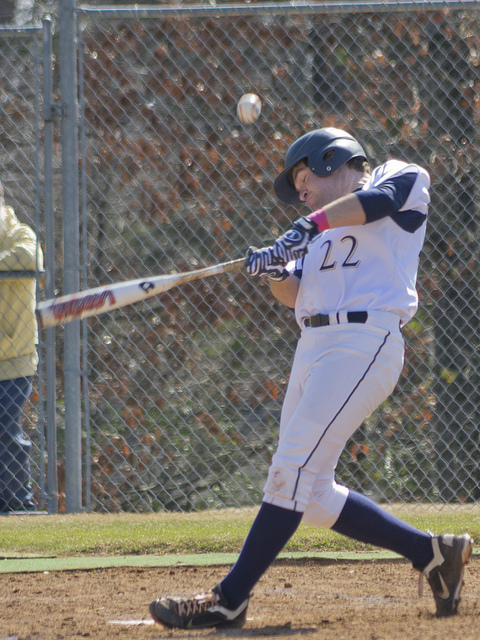

In [29]:
new_image = r'/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_test2017_41k/test2017/000000000016.jpg'

image = new_image
#real_caption = ' '.join([tokenizer.index_word[i] for i in cap_val[rid] if i not in [0]])
result, attention_plot = evaluate_my_greedy(image)
print(f"Model predicted caption =\n{result}")
PIL.Image.open(new_image)

# Reload comparison dict used for bleu scoring
## Has 5k imgs from Coco_Train dataset, not used in training
## Has the Ground Truth captions.

In [33]:
COMPARISON_DICT_WITH_GT_PICKLE_FILE = \
r'/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Code/ModelsRuns/ImgCapAttention/SavedData/BleuScoring/' + \
r'CompDict_ImgCapATTEND_Run4_Ep21_BleuScore_With_GT.pkl'

COMPARISON_DICT_WITH_GT_PICKLE_FILE

'/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Code/ModelsRuns/ImgCapAttention/SavedData/BleuScoring/CompDict_ImgCapATTEND_Run4_Ep21_BleuScore_With_GT.pkl'

In [35]:
if os.path.exists(COMPARISON_DICT_WITH_GT_PICKLE_FILE):
    with open(COMPARISON_DICT_WITH_GT_PICKLE_FILE, 'rb') as handle:
        comparison_dict_with_GT_reload = pickle.load(handle)
    print(f"Reloaded from picle file:\n{COMPARISON_DICT_WITH_GT_PICKLE_FILE}")
else:
    print(f"Problem reloading comparison dict")

Reloaded from picle file:
/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Code/ModelsRuns/ImgCapAttention/SavedData/BleuScoring/CompDict_ImgCapATTEND_Run4_Ep21_BleuScore_With_GT.pkl


# Demo and show output

In [49]:
DEMO_IMGS_DIR

'/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_train2017_118k/'

In [63]:
DEMO_IMGS_RUN_COUNT = 100


------------------------------
Inferrring image 1 of 100:
/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_train2017_118k/000000491856.jpg

Ground Truth descriptions:
Orig Desc 1 :: a living room with a fire place and lots of furniture.
Orig Desc 2 :: a living area with a fireplace and television
Orig Desc 3 :: a picture of a living room with a tv over a fireplace.
Orig Desc 4 :: a room features a flat screen tv, a fireplace, and knick knacks.
Orig Desc 5 :: this living room has a fire place and a tv on the wall


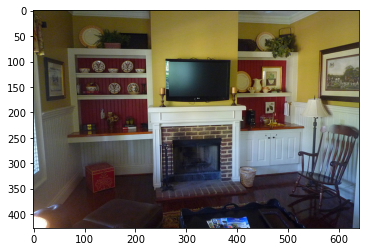

Greedy caption :: a living room with a fireplace and fireplace

------------------------------
Inferrring image 2 of 100:
/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_train2017_118k/000000491857.jpg

Ground Truth descriptions:
Orig Desc 1 :: a group of boats floating down a river in a city.
Orig Desc 2 :: many people move through water on small boats.
Orig Desc 3 :: the floating market with  many shallow canoes and woman paddlers.
Orig Desc 4 :: a waterway with many people on some small boats.
Orig Desc 5 :: a body of water that has a lot of people in small boats.


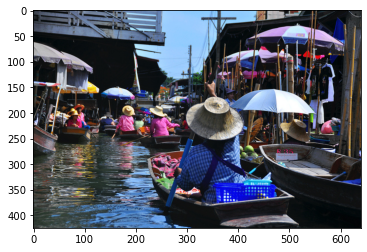

Greedy caption :: a man and a man and a man and a man and a man and a man and a man and a man and a man and a man and a man and a man and a man and a man and a man and a man and a man and a

------------------------------
Inferrring image 3 of 100:
/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_train2017_118k/000000491872.jpg

Ground Truth descriptions:
Orig Desc 1 :: a person pouring water into a drain from a bowl.
Orig Desc 2 :: a man pouring water from a blue bowl onto a with object
Orig Desc 3 :: a man pours water from a blue bowl into a white basin.
Orig Desc 4 :: the man is cleaning the toilet bowl. 
Orig Desc 5 :: a person pouring a bowl filled with water into another bowl.


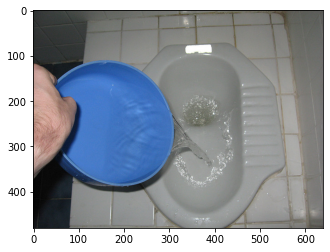

Greedy caption :: a man in a bathroom with a toilet

------------------------------
Inferrring image 4 of 100:
/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_train2017_118k/000000491873.jpg

Ground Truth descriptions:
Orig Desc 1 :: a man takes a "selfie" in a mirror with a camera.
Orig Desc 2 :: a person taking a photo in a mirror
Orig Desc 3 :: a man taking a photo of himself in the mirror while looking at the cat.
Orig Desc 4 :: a man reflected in a mirror looking at a cat sitting the window.
Orig Desc 5 :: a man taking a picture of himself in the mirror with a digital camera.


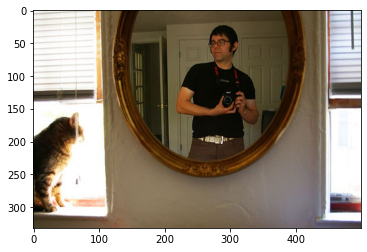

Greedy caption :: a man standing in front of a window

------------------------------
Inferrring image 5 of 100:
/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_train2017_118k/000000491879.jpg

Ground Truth descriptions:
Orig Desc 1 :: a man cleaning a surf board on top of a deck.
Orig Desc 2 :: man preparing surfboard in natural outdoor wooded area.
Orig Desc 3 :: a person on a wooden deck with many surfboards.
Orig Desc 4 :: a man working on surfboards on top of a wooden beck.
Orig Desc 5 :: a man is working on a blue surfboard.


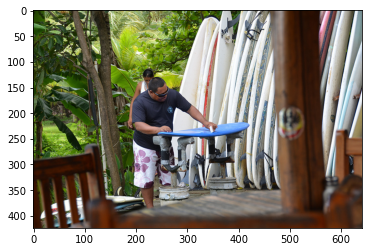

Greedy caption :: a man sitting on a wooden bench

------------------------------
Inferrring image 6 of 100:
/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_train2017_118k/000000491881.jpg

Ground Truth descriptions:
Orig Desc 1 :: a large crane lifting up a school bus on  a parking lot.
Orig Desc 2 :: a school bus by a crane and truck with a mountain view in the background.
Orig Desc 3 :: large crane next to parking lot with vehicles.
Orig Desc 4 :: there is a school bus parked next to other vehicles.
Orig Desc 5 :: multiple vehicles are parked in a lot with a snowy mountain range in the background.


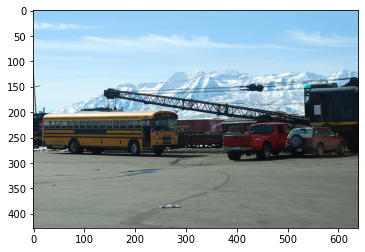

Greedy caption :: a red and white truck is towing a red and red bus

------------------------------
Inferrring image 7 of 100:
/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_train2017_118k/000000491883.jpg

Ground Truth descriptions:
Orig Desc 1 :: a tray with a chili dog next to a  cup of soda.
Orig Desc 2 :: a hotdog and a drink on a tray
Orig Desc 3 :: a tray on a metal table with a soda and hot dog.
Orig Desc 4 :: a hot dog with sauce on it and a cup of soda.
Orig Desc 5 :: a chili dog and a soda sitting on a tray 


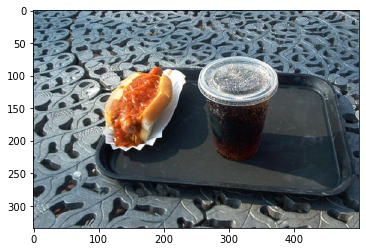

Greedy caption :: a plate with a croissant make a bite out of a plate

------------------------------
Inferrring image 8 of 100:
/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_train2017_118k/000000491888.jpg

Ground Truth descriptions:
Orig Desc 1 :: a table is set with  a bowl of fruit.
Orig Desc 2 :: a breakfast table setting for one with pastry, fruit, juice, and coffee
Orig Desc 3 :: a table with a cloth on it has a meal and drinks on it
Orig Desc 4 :: a table with some food and beverages on it 
Orig Desc 5 :: a well arranged table and a flower in a glass vase


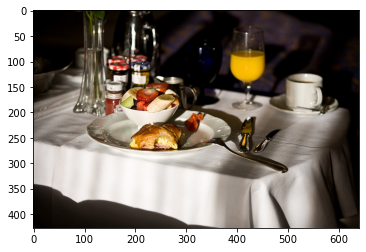

Greedy caption :: a table set for a bite of them

------------------------------
Inferrring image 9 of 100:
/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_train2017_118k/000000491899.jpg

Ground Truth descriptions:
Orig Desc 1 :: a hot dog on a bun covered with toppings.
Orig Desc 2 :: a hot dog on a bun is covered in onions, relish, cheese and peppers.  
Orig Desc 3 :: a hotdog with various toppings on a paper wrapper with a pickle.
Orig Desc 4 :: a hotdog with mustard, relish, onions and peppers in a bun.
Orig Desc 5 :: a hot dog is sitting on a piece of wax paper.


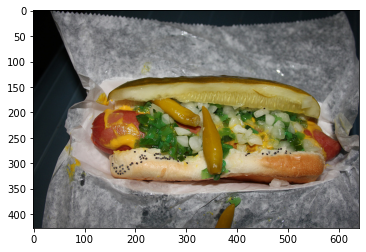

Greedy caption :: a hot dog with a hot dogs

------------------------------
Inferrring image 10 of 100:
/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_train2017_118k/000000491900.jpg

Ground Truth descriptions:
Orig Desc 1 :: a man swinging a baseball bat on a field.
Orig Desc 2 :: a catcher gets ready to catch a ball in a baseball game.
Orig Desc 3 :: a player is swinging the bat at a ball in a baseball game.
Orig Desc 4 :: the baseball player is swinging his bat as the player gets ready to catch.
Orig Desc 5 :: a couple of baseball players are out on the field


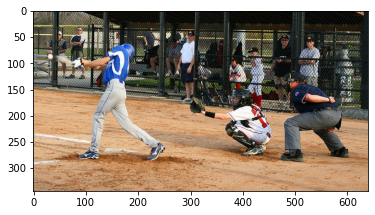

Greedy caption :: a baseball player swinging a bat at a ball

------------------------------
Inferrring image 11 of 100:
/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_train2017_118k/000000491902.jpg

Ground Truth descriptions:
Orig Desc 1 :: several people are seen sitting around and smoking.
Orig Desc 2 :: a coupe of people are sitting outside on a bench
Orig Desc 3 :: a man walking down the street with a cane while others sit on a bench.
Orig Desc 4 :: a group of people that are smoking on a bench
Orig Desc 5 :: a brick ally way with an old wooden bench with people sitting and smoking on it.  


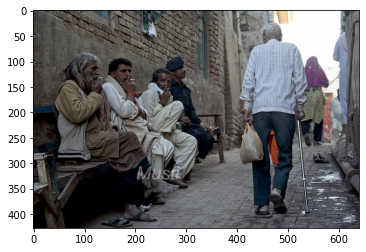

Greedy caption :: a group of people sitting on a sidewalk

------------------------------
Inferrring image 12 of 100:
/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_train2017_118k/000000491904.jpg

Ground Truth descriptions:
Orig Desc 1 :: a dog jumps into a dirty pond of water.
Orig Desc 2 :: a dog takes the plunge so that he can cool off.
Orig Desc 3 :: a big black and white dog jumping into the water.
Orig Desc 4 :: a black and white dog preparing to jump in water.
Orig Desc 5 :: a dog leaping into some muddy looking water.


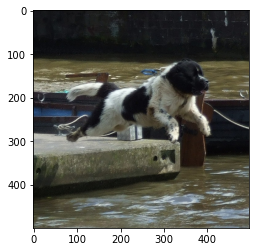

Greedy caption :: a dog on a surfboard in the water

------------------------------
Inferrring image 13 of 100:
/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_train2017_118k/000000491909.jpg

Ground Truth descriptions:
Orig Desc 1 :: closeup of a an elephants face with trees in background.
Orig Desc 2 :: this is the close up view of an elephant 's head. 
Orig Desc 3 :: a elephant that is standing in the grass.
Orig Desc 4 :: a baby elephant standing next to a tree and grass.
Orig Desc 5 :: a close up profile of an elephant with short tusks


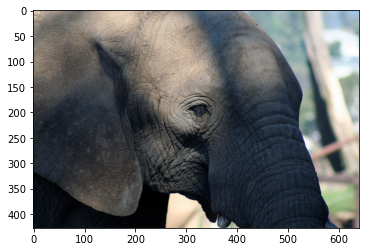

Greedy caption :: an elephant standing in a field

------------------------------
Inferrring image 14 of 100:
/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_train2017_118k/000000491910.jpg

Ground Truth descriptions:
Orig Desc 1 :: two mounted police on horses, one of them smiling
Orig Desc 2 :: two park policemen on top of horses in a park. 
Orig Desc 3 :: some police officers on horses in the road.
Orig Desc 4 :: park police sit side by side on their horses with a person nearby.
Orig Desc 5 :: two policemen are riding on horses which are standing still. 


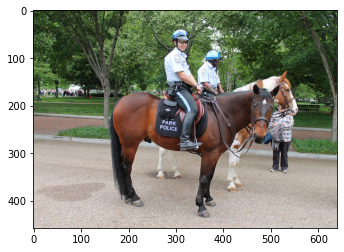

Greedy caption :: two men riding horses on a street

------------------------------
Inferrring image 15 of 100:
/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_train2017_118k/000000491914.jpg

Ground Truth descriptions:
Orig Desc 1 :: two zebra standing next to each other in front of a cart full of dry hay.
Orig Desc 2 :: two zebras looking for food on the ground
Orig Desc 3 :: two zebras graze for food side by side.
Orig Desc 4 :: two zebras in an enclosure eating some hay.
Orig Desc 5 :: the two zebra are standing very close to each other.


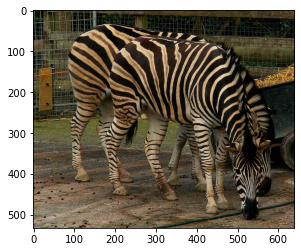

Greedy caption :: a zebra eating grass in a zoo

------------------------------
Inferrring image 16 of 100:
/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_train2017_118k/000000491921.jpg

Ground Truth descriptions:
Orig Desc 1 :: a couple of men standing on top of a field.
Orig Desc 2 :: two baseball players on a field playing a game. 
Orig Desc 3 :: baseball player on base and catcher ready to catch a ball.
Orig Desc 4 :: a baseman ready to catch the ball and a runner ready to run to the next base
Orig Desc 5 :: a baseball player gauging whether to steal second base.


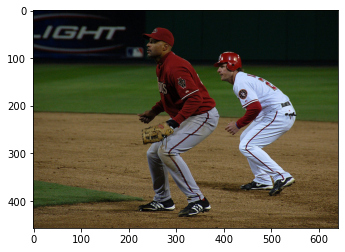

Greedy caption :: a baseball player is getting ready to throw the ball to home

------------------------------
Inferrring image 17 of 100:
/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_train2017_118k/000000491932.jpg

Ground Truth descriptions:
Orig Desc 1 :: a picture of a suitcase on top of a bed.
Orig Desc 2 :: a close up of a dusty old luggage bag
Orig Desc 3 :: a small old suitcase covered in various stickers
Orig Desc 4 :: a dusty vintage suitcase covered with travel stickers.
Orig Desc 5 :: a luggage case covered in stickers is shown. 


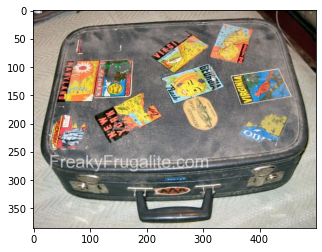

Greedy caption :: a man holding a blue and white sheet of stickers on the ground

------------------------------
Inferrring image 18 of 100:
/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_train2017_118k/000000491936.jpg

Ground Truth descriptions:
Orig Desc 1 :: the top of a bus with clock tower in the distance.
Orig Desc 2 :: an image of a tour bus with passengers on it
Orig Desc 3 :: the view of a city street with a clock tower in the back ground.
Orig Desc 4 :: a bus and cars in the street near a giant clock on a big tower.
Orig Desc 5 :: a group of people sit at the top of a bus on the road.


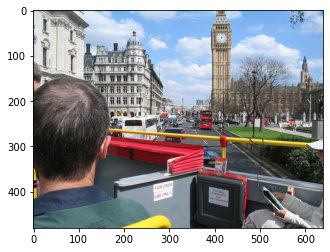

Greedy caption :: a man standing in front of a large bridge

------------------------------
Inferrring image 19 of 100:
/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_train2017_118k/000000491942.jpg

Ground Truth descriptions:
Orig Desc 1 :: an old bus is parked on the side of the street.
Orig Desc 2 :: the special 2 city bus shown parked along the street. 
Orig Desc 3 :: an old, antique transit bus parked at a stop.
Orig Desc 4 :: an old bus is parked along the side of a street.
Orig Desc 5 :: a green and beige bus in front of a red car is parked next to a sign. 


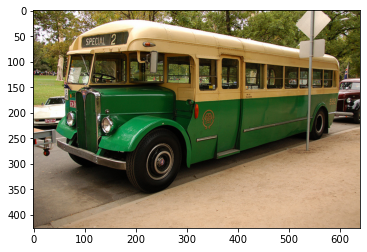

Greedy caption :: a bus is parked in a parking lot

------------------------------
Inferrring image 20 of 100:
/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_train2017_118k/000000491943.jpg

Ground Truth descriptions:
Orig Desc 1 :: on this picnic table in front of a lake there is plate with toast and jam and a mug.
Orig Desc 2 :: a wooden table with a plate of food and coffee cup.
Orig Desc 3 :: a plate of dessert is next to a coffee mug.
Orig Desc 4 :: this meal is on a table near a tree.
Orig Desc 5 :: a cake on a plate on a wooden table next to a cup


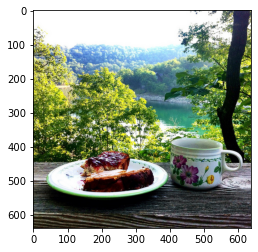

Greedy caption :: a table with a plate of food

------------------------------
Inferrring image 21 of 100:
/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_train2017_118k/000000491947.jpg

Ground Truth descriptions:
Orig Desc 1 :: a woman and a man standing next to a table using a laptop.
Orig Desc 2 :: a young man is using a laptop set on the table with a young lady next to him.
Orig Desc 3 :: couple smiling at the camera while on their laptop.
Orig Desc 4 :: a man standing in front of an apple laptop computer with a woman in a short skirt standing next to him and smiling.
Orig Desc 5 :: a male and a female in a dress and a laptop


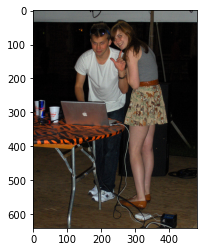

Greedy caption :: a woman and a woman sitting at a desk with a laptop

------------------------------
Inferrring image 22 of 100:
/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_train2017_118k/000000491955.jpg

Ground Truth descriptions:
Orig Desc 1 :: a skier is in the snow with his giggles and hat on. 
Orig Desc 2 :: a man riding skis down a snow covered slope.
Orig Desc 3 :: a man standing in the snow with his skiis. 
Orig Desc 4 :: a snow skier standing near a snow mountain
Orig Desc 5 :: skier wearing green and white on a snow trail. 


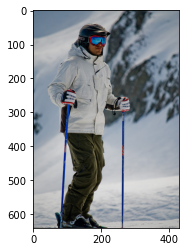

Greedy caption :: a man on a ski slope on a ski slope

------------------------------
Inferrring image 23 of 100:
/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_train2017_118k/000000491958.jpg

Ground Truth descriptions:
Orig Desc 1 :: the sheep in the fence are laying on straw bedding. 
Orig Desc 2 :: a herd of sheep laying down in the hay
Orig Desc 3 :: a small herd of sheep on hay in a barn.
Orig Desc 4 :: several sheep are pictured in an enclosure with hay.
Orig Desc 5 :: a group of sheep sitting and standing on some grass 


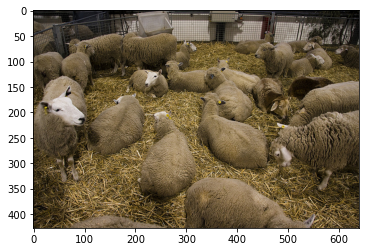

Greedy caption :: a group of sheep are standing in a pen

------------------------------
Inferrring image 24 of 100:
/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_train2017_118k/000000491959.jpg

Ground Truth descriptions:
Orig Desc 1 :: a street sign sitting on the side of a road.
Orig Desc 2 :: a street scene with focus on the back of a stop sign.
Orig Desc 3 :: a green street sign and a no biking sign on a pole with a stop sign.
Orig Desc 4 :: it is out in the open with various things in viewpoint. 

Orig Desc 5 :: a street is filled with passing cars and a no bicycle street sign.


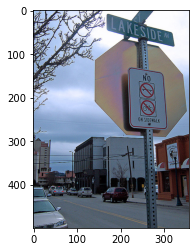

Greedy caption :: a yield sign that says queen st west <unk> street

------------------------------
Inferrring image 25 of 100:
/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_train2017_118k/000000491965.jpg

Ground Truth descriptions:
Orig Desc 1 :: a white bus driving past a hillside covered with trees.
Orig Desc 2 :: a bus sits parked outside of a building with desert landscaping.
Orig Desc 3 :: the city bus is driving next to a cactus.
Orig Desc 4 :: a train on a track in front of some rocks, trees and buildings.
Orig Desc 5 :: a bus going past an old building surrounded by plants 


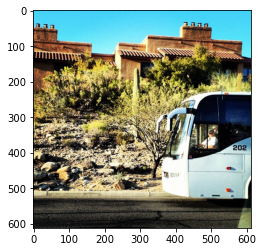

Greedy caption :: a bus is parked on a city street

------------------------------
Inferrring image 26 of 100:
/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_train2017_118k/000000491976.jpg

Ground Truth descriptions:
Orig Desc 1 :: a group of giraffe standing next to a fence.
Orig Desc 2 :: three giraffes standing next to a feed box.
Orig Desc 3 :: a couple of giraffes that are next to a fence
Orig Desc 4 :: three tall giraffes stand together beside a wood fence.
Orig Desc 5 :: several giraffes standing next to each other in a fenced in area.


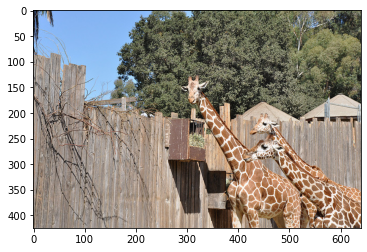

Greedy caption :: a group of giraffes standing on a dirt field

------------------------------
Inferrring image 27 of 100:
/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_train2017_118k/000000491981.jpg

Ground Truth descriptions:
Orig Desc 1 :: four women in a library reading books and using laptop computers.
Orig Desc 2 :: a table that has a bunch of girls at it
Orig Desc 3 :: a group of young students with laptop and material out
Orig Desc 4 :: the girls are at the table in the library, using their laptops and notebooks.
Orig Desc 5 :: four young women are sitting at a table studying.


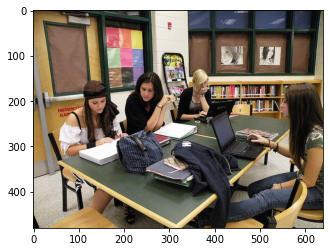

Greedy caption :: two men sitting on a laptop

------------------------------
Inferrring image 28 of 100:
/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_train2017_118k/000000491983.jpg

Ground Truth descriptions:
Orig Desc 1 :: small monitor screen sitting on a computer desk with no keyboard.
Orig Desc 2 :: a desktop computer sitting on a a desk. 
Orig Desc 3 :: computer desk with a monitor on top of it and office supplies around it. 
Orig Desc 4 :: a computer desk that is missing the keyboard and mouse.
Orig Desc 5 :: view of computer and computer desk with no keyboard.


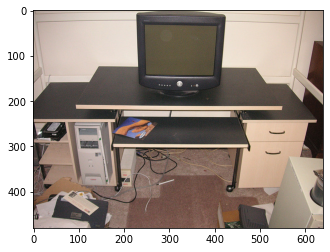

Greedy caption :: a desktop computer sitting on top of a desk

------------------------------
Inferrring image 29 of 100:
/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_train2017_118k/000000491985.jpg

Ground Truth descriptions:
Orig Desc 1 :: a black cat sitting on topo of a bed.
Orig Desc 2 :: a cat sitting on a bed with a knit hat on its head.
Orig Desc 3 :: black cat laying down wearing an orange cap with a black pompom.
Orig Desc 4 :: a black cat with a tiny knitted hat on its head.
Orig Desc 5 :: a black cat resting on a bed wearing a tiny winter hat.


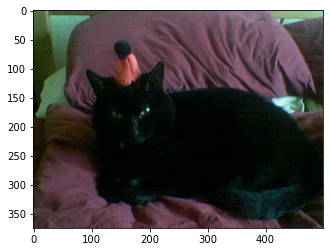

Greedy caption :: a cat sitting on a couch with a remote

------------------------------
Inferrring image 30 of 100:
/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_train2017_118k/000000491989.jpg

Ground Truth descriptions:
Orig Desc 1 :: a woman with a yellow frisbee in her hands.
Orig Desc 2 :: a heavy set woman in a blue shirt holds a yellow frisbee in a grassy area.
Orig Desc 3 :: an elderly lady holding a yellow frisbee in a field.
Orig Desc 4 :: a woman tossing a frisbee in the park.
Orig Desc 5 :: a lady holding a yellow frisbee and smiling about it.


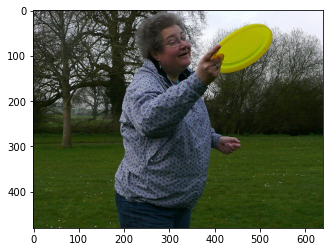

Greedy caption :: a woman holding a frisbee in a park

------------------------------
Inferrring image 31 of 100:
/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_train2017_118k/000000491991.jpg

Ground Truth descriptions:
Orig Desc 1 :: a yellow pensky moving truck sitting in a parking lot.
Orig Desc 2 :: several moving vans parked in a commercial parking area.
Orig Desc 3 :: multiple trucks sitting in a parking lot outside a building.
Orig Desc 4 :: a penske truck parked across several parking spots.
Orig Desc 5 :: three moving trucks in a parking lot next to a building.


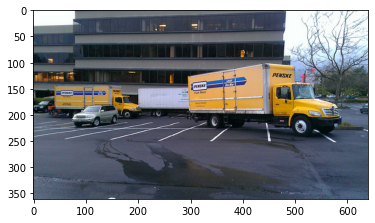

Greedy caption :: a large truck is parked on a highway

------------------------------
Inferrring image 32 of 100:
/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_train2017_118k/000000491992.jpg

Ground Truth descriptions:
Orig Desc 1 :: a couple of people paddle boarding with a dog on one board.
Orig Desc 2 :: two individuals, and one dog standing on surf boards in the middle of the water.
Orig Desc 3 :: two people riding surf boards on a body of water
Orig Desc 4 :: two are standing on surfboards with dogs on back.
Orig Desc 5 :: two men on paddle surfboards in the ocean.


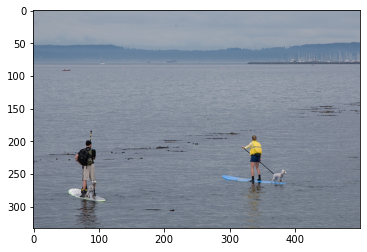

Greedy caption :: a little boy standing on a surfboard on surfboards

------------------------------
Inferrring image 33 of 100:
/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_train2017_118k/000000491997.jpg

Ground Truth descriptions:
Orig Desc 1 :: a zebra standing on top of a lush green field.
Orig Desc 2 :: the zebra is grazing on the grass all alone.
Orig Desc 3 :: a zebra from front, standing with head to the grass.
Orig Desc 4 :: a black and white zebra eating some green grass
Orig Desc 5 :: a single zebra grazing by a rocky wall.


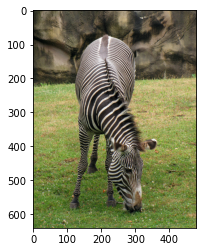

Greedy caption :: a zebra eating grass in a lush green field

------------------------------
Inferrring image 34 of 100:
/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_train2017_118k/000000491999.jpg

Ground Truth descriptions:
Orig Desc 1 :: a middle aged man wearing a business suit.
Orig Desc 2 :: a very happy smiling man in a nice suit.
Orig Desc 3 :: a man in a suit and tie smiles.
Orig Desc 4 :: photographic portrait of a smiling man in a suit
Orig Desc 5 :: a white guy in business attire and handkerchief in pocket, smiling


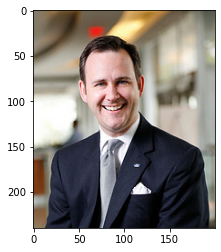

Greedy caption :: a man in a business suit and tie and a tie

------------------------------
Inferrring image 35 of 100:
/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_train2017_118k/000000492008.jpg

Ground Truth descriptions:
Orig Desc 1 :: a skateboarder executes a trick up against the wall.
Orig Desc 2 :: man standing on edge of skateboard near cinder block wall.
Orig Desc 3 :: a man is doing tricks on a skateboard
Orig Desc 4 :: a man in a plaid shirt leaning up against a wall with his skateboard.
Orig Desc 5 :: a boy does a skateboarding trick next to a building.


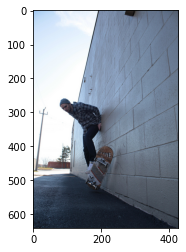

Greedy caption :: a skateboarder doing a trick on a skateboard

------------------------------
Inferrring image 36 of 100:
/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_train2017_118k/000000492016.jpg

Ground Truth descriptions:
Orig Desc 1 :: two black plastic containers filled with meat, gravy and veggies.
Orig Desc 2 :: two small containers on a table, one with veggies and one with a main course.
Orig Desc 3 :: a lunch box with raw vegetables, toys and an entree on a terry towel.
Orig Desc 4 :: a bunch of veggies are in a small black bowl
Orig Desc 5 :: vegetables and other types of good are in two black containers.


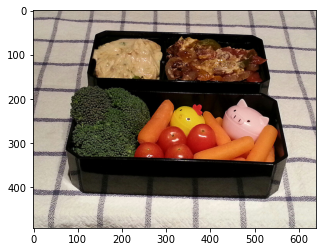

Greedy caption :: a bento kind of food with a bowl of nuts and a bowl of nuts and a bowl of nuts and a bowl of nuts and a bowl of nuts and a bowl of nuts and a bowl of nuts and a bowl of nuts and a bowl of nuts and a

------------------------------
Inferrring image 37 of 100:
/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_train2017_118k/000000492020.jpg

Ground Truth descriptions:
Orig Desc 1 :: the man is interested in a bike on the rack.
Orig Desc 2 :: a person with a red shirt and black shorts standing next to a bike. 
Orig Desc 3 :: a line of bikes are shown that are identical.
Orig Desc 4 :: a man puts his bycycle into a bike rack filled with other bikes.
Orig Desc 5 :: a man walking a bike towards a bike stand.


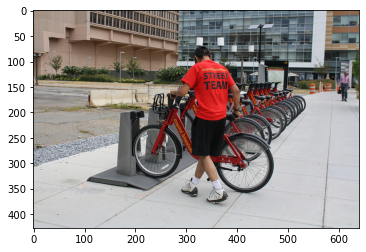

Greedy caption :: a man riding a bike is parked on the sidewalk

------------------------------
Inferrring image 38 of 100:
/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_train2017_118k/000000492025.jpg

Ground Truth descriptions:
Orig Desc 1 :: a statue that is wearing a knit cap and holding a teddy bear.
Orig Desc 2 :: a statue in a garden wearing a real hat and holding a real teddy bear.
Orig Desc 3 :: statue wearing a pink hat and holding up a brown teddy bear. 
Orig Desc 4 :: a statue with a pink hat and is holding a brown teddy bear
Orig Desc 5 :: a black statue of a dog with a pink hat is holding a teddy bear. 


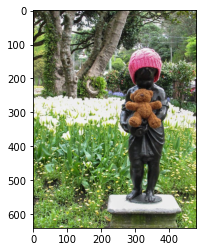

Greedy caption :: a young boy in a hat hat and hat and a tree with a doll

------------------------------
Inferrring image 39 of 100:
/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_train2017_118k/000000492030.jpg

Ground Truth descriptions:
Orig Desc 1 :: a man standing in the ocean with his dog in front of a boat.
Orig Desc 2 :: a man and a dog playing in the ocean.
Orig Desc 3 :: a ship, a man, and a dog are in the ocean.
Orig Desc 4 :: people, a dog, and a ship in the ocean.
Orig Desc 5 :: person in the ocean looking toward a large ship.


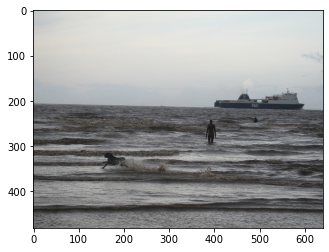

Greedy caption :: a man riding a surfboard in the water

------------------------------
Inferrring image 40 of 100:
/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_train2017_118k/000000492037.jpg

Ground Truth descriptions:
Orig Desc 1 :: black bear in a large field of grass. 
Orig Desc 2 :: there is a bear that is eating grass inthe yatd
Orig Desc 3 :: two bears in the grass on a sunny day. 
Orig Desc 4 :: a black bear roaming through a field near another large animal.
Orig Desc 5 :: a brown bear and a bison are in a grassy field.


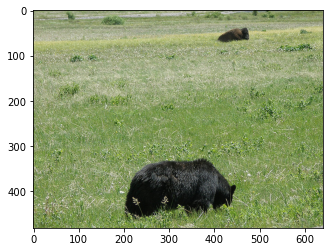

Greedy caption :: a bear cub is walking through a grassy field

------------------------------
Inferrring image 41 of 100:
/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_train2017_118k/000000492040.jpg

Ground Truth descriptions:
Orig Desc 1 :: several people in the kitchen with one cooking on the stove.
Orig Desc 2 :: three people are talking together in a kitchen.
Orig Desc 3 :: friends in a kitchen about to have a meal together
Orig Desc 4 :: two women sitting at the kitchen bar, while a man is cooking
Orig Desc 5 :: three friends converse in a kitchen, one cooking a meal


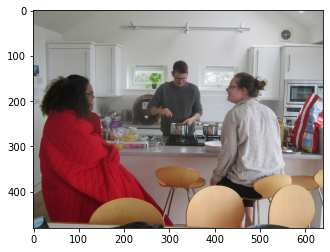

Greedy caption :: a group of people are standing around a table with a woman in a room

------------------------------
Inferrring image 42 of 100:
/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_train2017_118k/000000492041.jpg

Ground Truth descriptions:
Orig Desc 1 :: a man in white playing tennis as others watch
Orig Desc 2 :: a man standing on a tennis court holding a racquet.
Orig Desc 3 :: a man is playing tennis on a tennis court with people watching.
Orig Desc 4 :: player on court during tennis match with onlookers nearby.
Orig Desc 5 :: a male tennis player with a hat and sunglasses standing on a hard surface court with a racket in his hand.


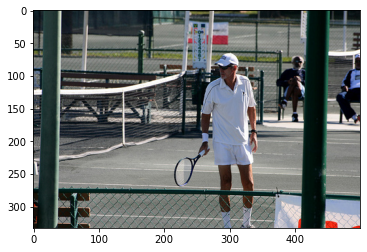

Greedy caption :: two men playing tennis on a tennis court

------------------------------
Inferrring image 43 of 100:
/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_train2017_118k/000000492051.jpg

Ground Truth descriptions:
Orig Desc 1 :: a room filled with lots of furniture and a table.
Orig Desc 2 :: a den with a couch, table, radio and a mirror.
Orig Desc 3 :: a small living room with antique furniture and old wallpaper
Orig Desc 4 :: a black and white photo of a living room with a couch and a table 
Orig Desc 5 :: a empty living room that has a table in the center.


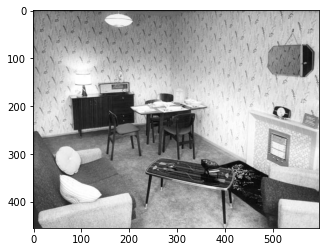

Greedy caption :: a living room with a couch and a television

------------------------------
Inferrring image 44 of 100:
/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_train2017_118k/000000492055.jpg

Ground Truth descriptions:
Orig Desc 1 :: a large pile of broccoli in ice laying beside each other.
Orig Desc 2 :: there is a bundle of broccoli with ice cubes.
Orig Desc 3 :: a stacked pile of large stalks of broccoli.
Orig Desc 4 :: there are many broccoli heads side by side.
Orig Desc 5 :: a number of pieces of broccoli piled together with ice.


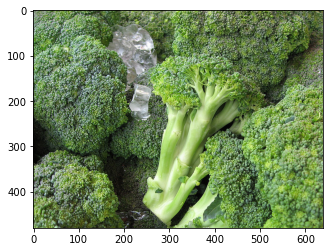

Greedy caption :: a close up of broccoli cut up close to be used

------------------------------
Inferrring image 45 of 100:
/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_train2017_118k/000000492057.jpg

Ground Truth descriptions:
Orig Desc 1 :: a boy taking a picture of himself in mirror.
Orig Desc 2 :: a man is frowning and taking a selfie at the same time.
Orig Desc 3 :: a man taking a picture of himself in a mirror.
Orig Desc 4 :: a boy talking a picture of himself while in front of the mirror. 
Orig Desc 5 :: a man taking a picture of himself with his phone in a mirror.


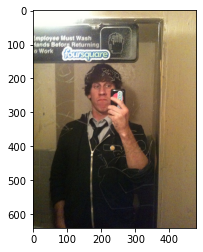

Greedy caption :: a man in a black shirt is taking a selfie in a bathroom

------------------------------
Inferrring image 46 of 100:
/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_train2017_118k/000000492060.jpg

Ground Truth descriptions:
Orig Desc 1 :: a red and yellow bus passing down the street
Orig Desc 2 :: there is a yellow and red bus coming up the street
Orig Desc 3 :: a bus driving on a brick street 
Orig Desc 4 :: a car drives on a street next to some parked cars
Orig Desc 5 :: a city bus traveling along a cobblestone street on a very cloudy day.


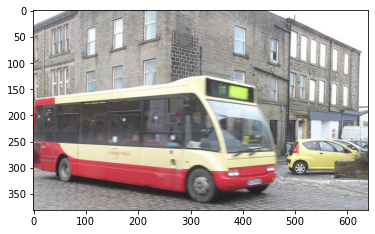

Greedy caption :: a bus traveling down a street next to a building

------------------------------
Inferrring image 47 of 100:
/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_train2017_118k/000000492065.jpg

Ground Truth descriptions:
Orig Desc 1 :: a woman cooks in a spacious kitchen with a breakfast bar.
Orig Desc 2 :: a room that has some stools and some others things
Orig Desc 3 :: a person is standing at a stove in a kitchen.
Orig Desc 4 :: a woman in a small kitchen cooking 
Orig Desc 5 :: a lady in a pink kitchen standing at the stove


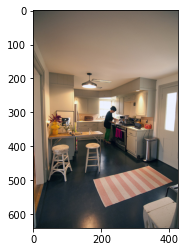

Greedy caption :: a kitchen with a sink and a kitchen

------------------------------
Inferrring image 48 of 100:
/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_train2017_118k/000000492067.jpg

Ground Truth descriptions:
Orig Desc 1 :: an airplane flying over a man standing in the ocean.
Orig Desc 2 :: a airplane flying over a person walking into body of water with a boat in it.  
Orig Desc 3 :: guy standing in the ocean while a low flying plane is overhead 
Orig Desc 4 :: an airplane flying over the water where someone is swimming.
Orig Desc 5 :: the airplane is flying low over the water.


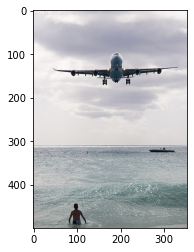

Greedy caption :: a man and a person on the beach flying a plane

------------------------------
Inferrring image 49 of 100:
/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_train2017_118k/000000492069.jpg

Ground Truth descriptions:
Orig Desc 1 :: a table is laden with treats and decorations for a wedding.
Orig Desc 2 :: a long table with a white table cloth features blue decor and dishes.
Orig Desc 3 :: a candy station decorated in blue and teal sits under a mirror. 
Orig Desc 4 :: an elegant table full of blue arrangements of vases.
Orig Desc 5 :: a white table filled with plates and bowls of food.


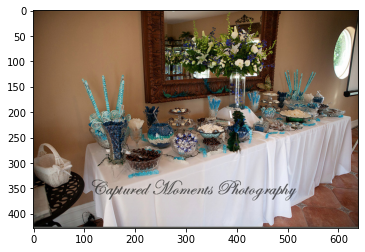

Greedy caption :: a table set up with a bunch of flowers

------------------------------
Inferrring image 50 of 100:
/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_train2017_118k/000000492075.jpg

Ground Truth descriptions:
Orig Desc 1 :: two giraffes eat grass out of a cage hanging from the ceiling.
Orig Desc 2 :: two giraffes eating together from a hay feeder
Orig Desc 3 :: two giraffes inside a wooden enclosure eating hay.
Orig Desc 4 :: two giraffes feeding from a man made feeder
Orig Desc 5 :: giraffe in an animal pen eating from a feeder hanging on the ceiling.


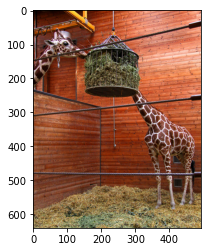

Greedy caption :: a giraffe standing next to a fence inside a fence inside a fence inside a fence

------------------------------
Inferrring image 51 of 100:
/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_train2017_118k/000000492078.jpg

Ground Truth descriptions:
Orig Desc 1 :: this is a woman giving a child a cake
Orig Desc 2 :: a women serving a bundt cake with candles to a child.
Orig Desc 3 :: a woman holding a cake with candles in front of a boy.
Orig Desc 4 :: a woman carrying a cake with lit candles towards a young boy.
Orig Desc 5 :: a woman gives a birthday cake to a young child.


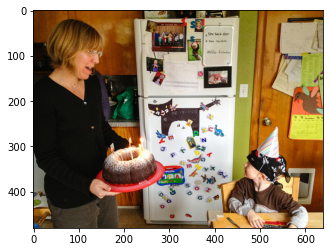

Greedy caption :: a woman standing in front of a refrigerator

------------------------------
Inferrring image 52 of 100:
/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_train2017_118k/000000492079.jpg

Ground Truth descriptions:
Orig Desc 1 :: an adorable little girl eating half a sandwich.
Orig Desc 2 :: a young child  eating pieces of ripped bread
Orig Desc 3 :: this is an image of a baby eating a sandwich
Orig Desc 4 :: the child eating a bagel at a restaurant.
Orig Desc 5 :: a young girl who is eating a piece of bread.


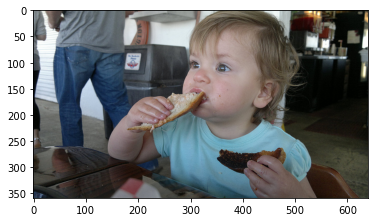

Greedy caption :: a young girl eating a piece of pizza

------------------------------
Inferrring image 53 of 100:
/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_train2017_118k/000000492084.jpg

Ground Truth descriptions:
Orig Desc 1 :: a young girl brushing a woman's teeth on a couch.
Orig Desc 2 :: a toddler attempts to brush a woman's teeth.
Orig Desc 3 :: a woman plays with a toddler sitting on a couch.
Orig Desc 4 :: great picture of many individuals having a good time.

Orig Desc 5 :: a child with a tooth brush in a persons mouth


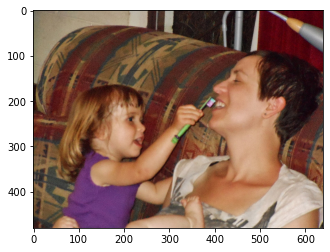

Greedy caption :: a woman and a woman are feeding each other

------------------------------
Inferrring image 54 of 100:
/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_train2017_118k/000000492096.jpg

Ground Truth descriptions:
Orig Desc 1 :: a women who is talking on her cell phone.
Orig Desc 2 :: a lady is talking on her cellular phone near a crowd. 
Orig Desc 3 :: a close up of a person talking on a cell phone
Orig Desc 4 :: a woman walks and talks on her cell phone.
Orig Desc 5 :: woman holding up a black cellphone in a crowd. 


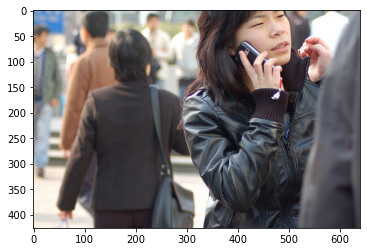

Greedy caption :: a woman is talking on a cell phone

------------------------------
Inferrring image 55 of 100:
/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_train2017_118k/000000492102.jpg

Ground Truth descriptions:
Orig Desc 1 :: a passenger train traveling through a tunnel covered with a forest.
Orig Desc 2 :: a train traveling  past a signal light into a dark tunnel.
Orig Desc 3 :: a train is entering a historical tunnel covered topped with greenery.
Orig Desc 4 :: a passenger train heading into a tunnel. 
Orig Desc 5 :: a train is entering a tunnel under a bridge.


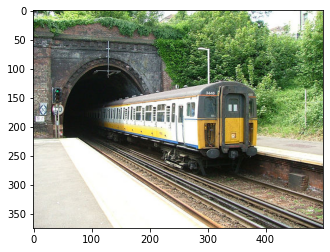

Greedy caption :: a train is traveling down train tracks

------------------------------
Inferrring image 56 of 100:
/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_train2017_118k/000000492104.jpg

Ground Truth descriptions:
Orig Desc 1 :: a train is rested on some train tracks
Orig Desc 2 :: a number of train tracks with a man standing near a tower. 
Orig Desc 3 :: worker walking next to the tracks that a train car is on
Orig Desc 4 :: an orange and black train engine on tracks next to buildings.
Orig Desc 5 :: a train engine on railroad tracks with a person walking near the track.


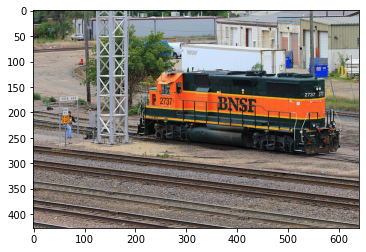

Greedy caption :: a train is on the tracks

------------------------------
Inferrring image 57 of 100:
/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_train2017_118k/000000492107.jpg

Ground Truth descriptions:
Orig Desc 1 :: a woman and two men are making pizzas around a table.
Orig Desc 2 :: three people smiling while they make mini pizzas.
Orig Desc 3 :: three people gathered around a table with ingredients preparing their own pizza
Orig Desc 4 :: three people preparing pizzas on a table set with ingredients.  
Orig Desc 5 :: two guys and one girl displaying a table full of pizza making toppings.


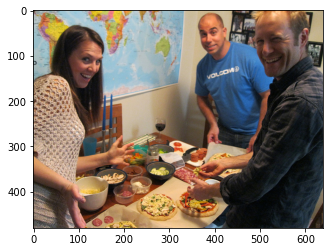

Greedy caption :: a woman is standing in front of a cake

------------------------------
Inferrring image 58 of 100:
/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_train2017_118k/000000492114.jpg

Ground Truth descriptions:
Orig Desc 1 :: a woman posing in front of a display of baseball players at home plate.
Orig Desc 2 :: a woman  holding a baseball bat over a base.
Orig Desc 3 :: a woman in casual clothes holds a bat at home plate in a baseball museum.
Orig Desc 4 :: a woman is posing with a bat at a baseball themed wax figure exhibit.
Orig Desc 5 :: a woman posing for a picture in a wax museum.


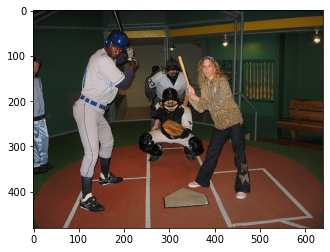

Greedy caption :: a baseball player swinging a bat at a ball

------------------------------
Inferrring image 59 of 100:
/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_train2017_118k/000000492123.jpg

Ground Truth descriptions:
Orig Desc 1 :: a red fire truck driving down a street next to a  shopping center.
Orig Desc 2 :: a firetruck without emergency lights on cruising through an intersection.
Orig Desc 3 :: a fire truck speeding through a busy intersection.
Orig Desc 4 :: the fire truck is stopped at the street light.
Orig Desc 5 :: a fire truck crosses the intersection at first street.


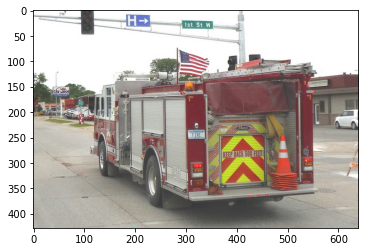

Greedy caption :: a red fire truck driving down the street

------------------------------
Inferrring image 60 of 100:
/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_train2017_118k/000000492125.jpg

Ground Truth descriptions:
Orig Desc 1 :: a couple of young men standing at the entrance to a subway.
Orig Desc 2 :: an historic photo shows boys standing near an underpass.
Orig Desc 3 :: a couple of guys standing  by the subway
Orig Desc 4 :: a pair of people stand next to the entrance of a subway.
Orig Desc 5 :: two boys wait at the entrance to a hamburg subway station.


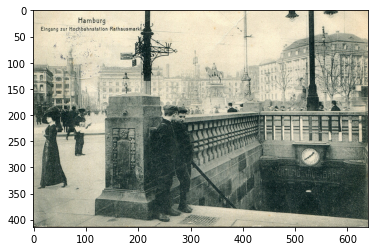

Greedy caption :: a man is standing on a bridge over a bridge

------------------------------
Inferrring image 61 of 100:
/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_train2017_118k/000000492129.jpg

Ground Truth descriptions:
Orig Desc 1 :: a group of young guys riding skateboards in a park.
Orig Desc 2 :: some male skateboarders skating down a sidewalk one has a camera
Orig Desc 3 :: a skateboarder videotapes another skateboarder as he prepares for a trick.
Orig Desc 4 :: one kid on a skateboard filming another kid on a skateboard.
Orig Desc 5 :: two boys skating on a skateboard next to each other. 


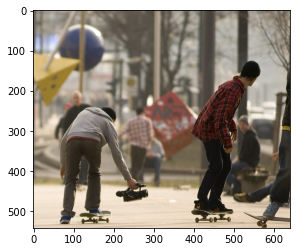

Greedy caption :: a man riding a skateboard on a skateboard

------------------------------
Inferrring image 62 of 100:
/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_train2017_118k/000000492131.jpg

Ground Truth descriptions:
Orig Desc 1 :: you can see a bike rider in the distance jumping two vehicles at once.
Orig Desc 2 :: a guy on a motorcycle jumping over some cars.
Orig Desc 3 :: a man on a bike jumping over two parked cars
Orig Desc 4 :: a person jumping over two mini vans with a dirt bike 
Orig Desc 5 :: a man riding a motorcycle over two cars.


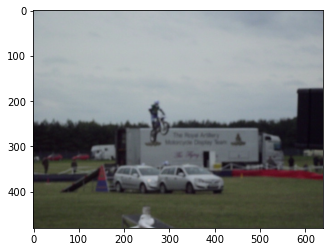

Greedy caption :: a plane that is on a field

------------------------------
Inferrring image 63 of 100:
/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_train2017_118k/000000492132.jpg

Ground Truth descriptions:
Orig Desc 1 :: people walking in a museum with a airplane hanging from the celing.
Orig Desc 2 :: visitors seen below bi-plane  looking at displays in museum setting.
Orig Desc 3 :: a full-size fighter plane hanging in the air inside a building
Orig Desc 4 ::  an airplane suspended from a ceiling over a museum.
Orig Desc 5 :: an old world war ii airplane is hanging from cables from the ceiling with a bunch of people walking around.


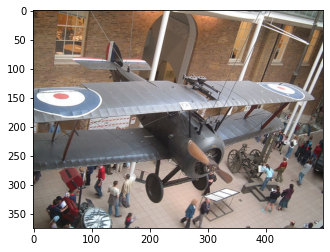

Greedy caption :: a plane parked at an airport with a plane

------------------------------
Inferrring image 64 of 100:
/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_train2017_118k/000000492137.jpg

Ground Truth descriptions:
Orig Desc 1 :: a cat is sleeping beside a laptop on the table
Orig Desc 2 :: here is a soul in the image alone. 

Orig Desc 3 :: an orange cat rests besides a laptop computer.
Orig Desc 4 :: an orange and white cat resting its head on a laptop
Orig Desc 5 :: an orange tabby cat is sleeping on a table next to a lap top computer.


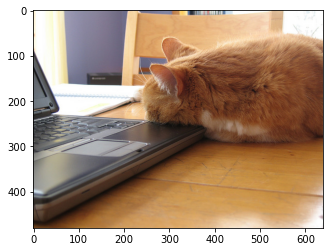

Greedy caption :: a cat is laying on a wooden table

------------------------------
Inferrring image 65 of 100:
/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_train2017_118k/000000492138.jpg

Ground Truth descriptions:
Orig Desc 1 :: two women are in snow gear in the snow.
Orig Desc 2 :: a woman wearing skis, lying down on side in snow beside a woman squatting down holding a snowboard, both smiling at camera.
Orig Desc 3 :: one female snow skier and a snowboarder 
Orig Desc 4 :: some women in the snow with skiis and snowboards 
Orig Desc 5 :: pair of women enjoying winter sports in evening.


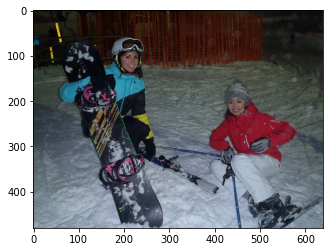

Greedy caption :: a man in a red jacket is posing for a picture

------------------------------
Inferrring image 66 of 100:
/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_train2017_118k/000000492151.jpg

Ground Truth descriptions:
Orig Desc 1 :: a kitchen has an open cabinet on the side.
Orig Desc 2 :: a shelf of various cooking things inside a small kitchen.
Orig Desc 3 :: a kitchen filled with appliances and lots of clutter.
Orig Desc 4 :: a very small kitchen separated from the next room by a shelf
Orig Desc 5 :: a compact kitchen set-up with shelves for storage and a small stove.


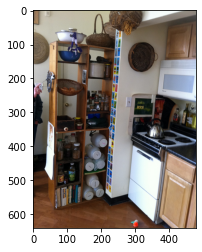

Greedy caption :: a kitchen with a refrigerator and a stove and a stove and a stove and a stove and a stove and a stove and a stove and a stove and a stove and a stove and a stove and a stove and a stove and a stove and a stove and a

------------------------------
Inferrring image 67 of 100:
/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_train2017_118k/000000492154.jpg

Ground Truth descriptions:
Orig Desc 1 :: men on motorcycles in front of a crowd.
Orig Desc 2 :: crowd of people gathered at the fence to see men on motorcycles
Orig Desc 3 :: three men sitting on their motorcycles around a crowd. 
Orig Desc 4 :: a couple of men sit on a motorcycle as people look on
Orig Desc 5 :: many people are watching several men ride motorcycles.


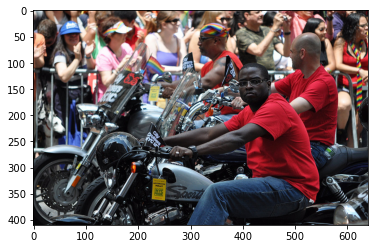

Greedy caption :: a man and a man and a man and a man and a man and a man and a man and a man and a man and a man and a man and a man and a man and a man and a man and a man and a man and a

------------------------------
Inferrring image 68 of 100:
/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_train2017_118k/000000492155.jpg

Ground Truth descriptions:
Orig Desc 1 :: there are many sheep together, one can be seen smiling
Orig Desc 2 :: a close up of a sheep's face in a bunch of sheep 
Orig Desc 3 :: the faces of two sheep who stand in a larger crowd of sheep. 
Orig Desc 4 :: one lamb, amongst other lambs, looking directly toward the camera 
Orig Desc 5 :: an adorable lamb is sitting in a flock of sheep.


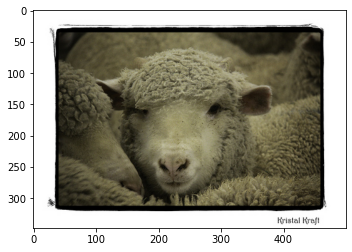

Greedy caption :: a sheep with a tag in the hay

------------------------------
Inferrring image 69 of 100:
/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_train2017_118k/000000492156.jpg

Ground Truth descriptions:
Orig Desc 1 :: a wet, snowy street with many cars and traffic lights.
Orig Desc 2 :: road side view of traffic on a rainy day.
Orig Desc 3 :: a dark and rainy day as traffic begins to back up in the city.
Orig Desc 4 :: a street with stop and go lights in the rain.
Orig Desc 5 :: busy cars on a very busy road with traffic.


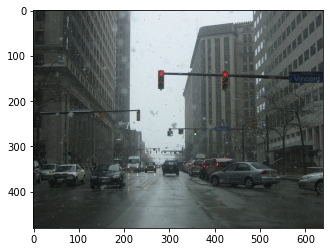

Greedy caption :: a busy intersection with traffic and pedestrians crossing

------------------------------
Inferrring image 70 of 100:
/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_train2017_118k/000000492163.jpg

Ground Truth descriptions:
Orig Desc 1 :: a silver and rusted colored fire hydrant sitting next to a crosswalk.
Orig Desc 2 :: an old metal fire hydrant sitting by the curb and a crosswalk 
Orig Desc 3 :: a fire hydrant is sitting on a sidewalk.
Orig Desc 4 :: this fire hydrant is predominately silver in color, a cross walk can be seen in the background.
Orig Desc 5 :: a fire hydrant sits next to a city street 


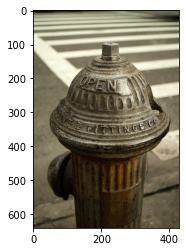

Greedy caption :: a fire hydrant sitting on a sidewalk

------------------------------
Inferrring image 71 of 100:
/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_train2017_118k/000000492164.jpg

Ground Truth descriptions:
Orig Desc 1 :: a young girl is in her bedroom looking at her phone with food in her mouth.
Orig Desc 2 :: a young woman checks her cell phone with food in her mouth.
Orig Desc 3 :: a girl eating in a bedroom while on a phone.
Orig Desc 4 :: a girl using a cell phone to take a picture of herself with a sandwich stuffed in her mouth
Orig Desc 5 :: a girl sits on a bed with a sandwich in her mouth looking at a cell phone. 


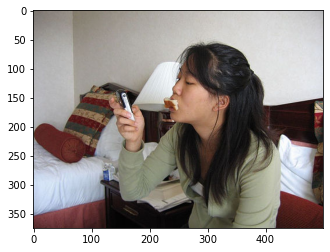

Greedy caption :: a woman is looking at a cell phone

------------------------------
Inferrring image 72 of 100:
/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_train2017_118k/000000492166.jpg

Ground Truth descriptions:
Orig Desc 1 :: a man is cross country skiing on a course with other skiers.
Orig Desc 2 :: an old man and another skier skiing down a slope
Orig Desc 3 :: two older guys skiing at a ski slope on their skis. 
Orig Desc 4 :: skiers are competing in a skiing race.   
Orig Desc 5 :: two snow skiers and one has a green top snow and trees


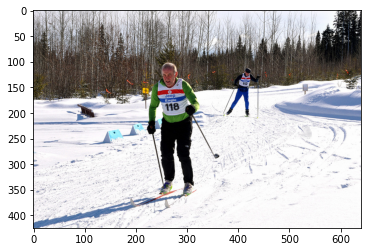

Greedy caption :: a man and a child on skis in the snow

------------------------------
Inferrring image 73 of 100:
/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_train2017_118k/000000492170.jpg

Ground Truth descriptions:
Orig Desc 1 :: a sign warning people about bears is under a stop sign.
Orig Desc 2 :: a street sign with an image of a bear on it and a stop sign.
Orig Desc 3 :: the street signs are written in a language we can not understand. 
Orig Desc 4 :: a stop sign and several other road signs attached to metal posts.
Orig Desc 5 :: a stop sign is shown with a sign below it.


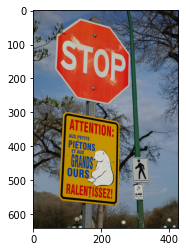

Greedy caption :: a stop sign with a stop sign on a pole

------------------------------
Inferrring image 74 of 100:
/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_train2017_118k/000000492171.jpg

Ground Truth descriptions:
Orig Desc 1 :: one person attempts to block another who is throwing a frisbee 
Orig Desc 2 :: a smaller girl is trying to block a frisbee throw from a bigger girl.
Orig Desc 3 :: a woman standing in front of another woman who is holding a frisbee.
Orig Desc 4 :: two girls playing a game of frisbee on a grassy field.
Orig Desc 5 :: two girls playing with a white frisbee in a grassy field.


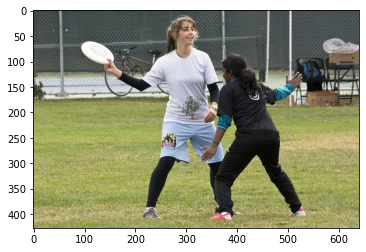

Greedy caption :: a man and a soccer ball in a park

------------------------------
Inferrring image 75 of 100:
/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_train2017_118k/000000492178.jpg

Ground Truth descriptions:
Orig Desc 1 :: a calzone topped with prosciutto on a plate.
Orig Desc 2 :: a large pastry with meat on top of it on a white plate.
Orig Desc 3 :: a close up of a plate of pizza
Orig Desc 4 :: a prosciutto pizza garnished with fresh chopped basil.
Orig Desc 5 :: a large dish of food on a table


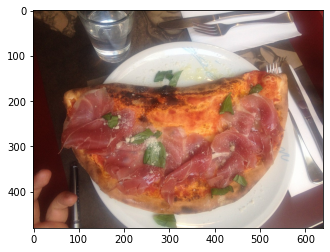

Greedy caption :: a pizza with a pizza on a plate

------------------------------
Inferrring image 76 of 100:
/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_train2017_118k/000000492179.jpg

Ground Truth descriptions:
Orig Desc 1 :: a man sitting at a table in front of a cake.
Orig Desc 2 :: old man blowing out candles on a small white cake. 
Orig Desc 3 :: a man blowing out some candles on a cake as others watch.
Orig Desc 4 :: blow all the candles out and make a wish.
Orig Desc 5 :: an older man blows out candles on a birthday cake


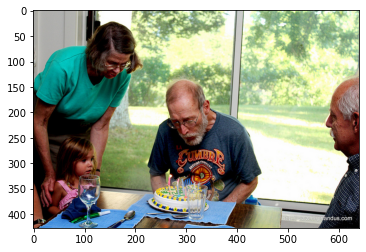

Greedy caption :: a group of people sitting around a table

------------------------------
Inferrring image 77 of 100:
/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_train2017_118k/000000492183.jpg

Ground Truth descriptions:
Orig Desc 1 :: a mini fridge is stocked with wine, sushi, pizza, and other items.
Orig Desc 2 :: a small open refrigerator with a bottle of wine inside.
Orig Desc 3 :: a small refrigerator has a bottle of wine it.
Orig Desc 4 :: small open office refrigerator displaying wine and packaged food.
Orig Desc 5 :: a bottle of wine is in a small fridge


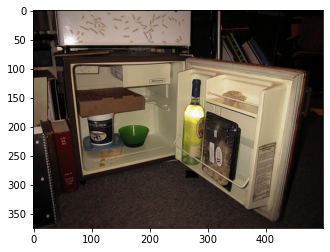

Greedy caption :: a kitchen with a refrigerator and a microwave

------------------------------
Inferrring image 78 of 100:
/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_train2017_118k/000000492196.jpg

Ground Truth descriptions:
Orig Desc 1 :: a boat tugs a barge behind it through the water.
Orig Desc 2 :: a barge pulling a load in the water
Orig Desc 3 :: a boat is moving a barge through the water.
Orig Desc 4 :: a towboat towing a barge with yellow containers on it.
Orig Desc 5 :: a tug boat pulling a barge with two yellow containers.


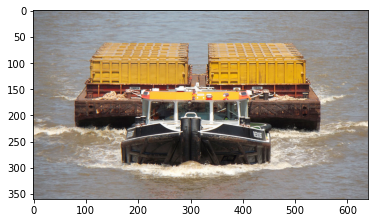

Greedy caption :: a military ship floats on a river next to boat

------------------------------
Inferrring image 79 of 100:
/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_train2017_118k/000000492198.jpg

Ground Truth descriptions:
Orig Desc 1 :: a man riding a wind sail next to a kiteboarder.
Orig Desc 2 :: two people on the ocean wind sailing and parasailing. 
Orig Desc 3 :: a person is para sailing on the ocean with another person.
Orig Desc 4 :: one person windsurfing while the other is kite-surfing in the ocean
Orig Desc 5 :: a kite surfer and a parasailer ride next to each other in the water.


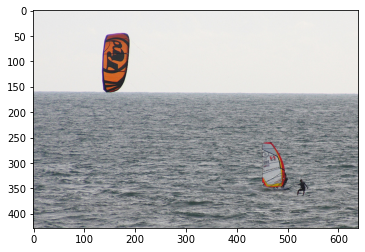

Greedy caption :: a man on a surfboard on a wake board

------------------------------
Inferrring image 80 of 100:
/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_train2017_118k/000000492213.jpg

Ground Truth descriptions:
Orig Desc 1 :: a pizza sitting on a wooden table with a slice missing.
Orig Desc 2 :: a pizza pie that has slices missing from it.
Orig Desc 3 :: a cheese pizza on a wooden tray with a slice missing
Orig Desc 4 :: the pizza is cut into 5 triangle pieces. 
Orig Desc 5 :: pizza with a slice taken out on a wood board.


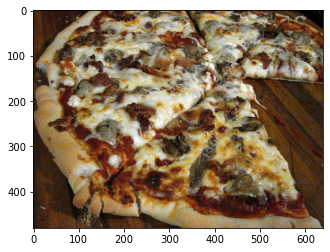

Greedy caption :: a pizza with a fork and knife

------------------------------
Inferrring image 81 of 100:
/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_train2017_118k/000000492214.jpg

Ground Truth descriptions:
Orig Desc 1 :: sepia photograph of boats on water next to trees.
Orig Desc 2 :: a group of boats floating on top of a lake.
Orig Desc 3 :: there are a few small boats in the water. 
Orig Desc 4 :: a group of boats in a body water on a clear sky day.
Orig Desc 5 :: a river full of floating sailboats in mid afternoon.


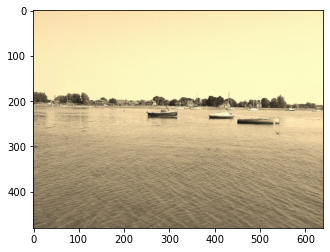

Greedy caption :: a truck driving down a river with boats

------------------------------
Inferrring image 82 of 100:
/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_train2017_118k/000000492215.jpg

Ground Truth descriptions:
Orig Desc 1 :: a woman in a maid's uniform is next to a man onstage.
Orig Desc 2 :: two people standing on a stage wearing costumes
Orig Desc 3 :: a man and woman standing together on a stage.
Orig Desc 4 :: some performers are on stage and doing a show. 
Orig Desc 5 :: a female feeds a man on the runway while an audience looks on.
Orig Desc 6 :: an asian man and woman are standing on a stage.


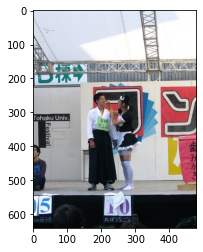

Greedy caption :: a woman standing in front of a woman standing in front of a man standing in front of a man standing in front of a man standing in front of a man standing in front of a man standing in front of a man standing in front of a man standing in

------------------------------
Inferrring image 83 of 100:
/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_train2017_118k/000000492219.jpg

Ground Truth descriptions:
Orig Desc 1 :: two guys in the living room playing a game with wii motes 
Orig Desc 2 :: two men hold remotes while playing a video game
Orig Desc 3 :: two young men are standing while using video game remotes.
Orig Desc 4 :: two men standing up that are holding remote controllers.
Orig Desc 5 :: two men stand in a living room playing a video game.


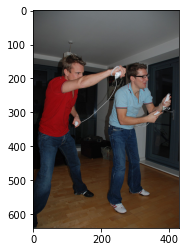

Greedy caption :: a man and a woman are playing a game of wii

------------------------------
Inferrring image 84 of 100:
/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_train2017_118k/000000492235.jpg

Ground Truth descriptions:
Orig Desc 1 :: a large brown bear standing on top of a log.
Orig Desc 2 :: a brown bear on a log in his zoo enclosure

Orig Desc 3 :: a brown bear in an exhibit standing on a tree branch.
Orig Desc 4 :: the bear is enjoying playing with the log.
Orig Desc 5 :: a brown bear standing on a tree branch near a rock wall.


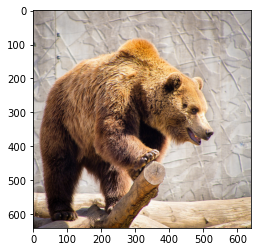

Greedy caption :: a bear walking in the woods next to a tree in a zoo

------------------------------
Inferrring image 85 of 100:
/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_train2017_118k/000000492236.jpg

Ground Truth descriptions:
Orig Desc 1 :: a pair of men at a wedding have drinks at a bar.
Orig Desc 2 :: a reflection of two men looking down at their glasses as they sit in front of a bar with people standing in the background. 
Orig Desc 3 :: two men in ties are sitting at a bar.
Orig Desc 4 :: there are two men sitting at the table
Orig Desc 5 :: two men preparing drinks together at a party. 


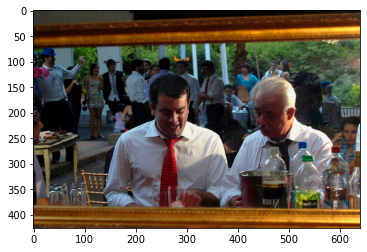

Greedy caption :: a man and a table with a woman

------------------------------
Inferrring image 86 of 100:
/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_train2017_118k/000000492243.jpg

Ground Truth descriptions:
Orig Desc 1 :: a tv sits on the tv stand with a keyboard and mouse
Orig Desc 2 :: a tv and equipment sitting on a console.
Orig Desc 3 :: the desk has a television on it with speakers
Orig Desc 4 :: a television with the menu for a dvd player on the screen.
Orig Desc 5 :: this screen seems to be used for a variety of things.


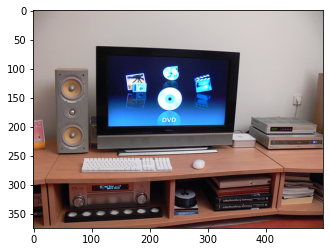

Greedy caption :: a tv that is sitting on top of a tv

------------------------------
Inferrring image 87 of 100:
/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_train2017_118k/000000492244.jpg

Ground Truth descriptions:
Orig Desc 1 :: an old car stopped at a railroad crossing with a train going by.
Orig Desc 2 :: a car waiting for a train to pass.
Orig Desc 3 :: the car is waiting for the train to pass before crossing.
Orig Desc 4 :: a car stopped at a railroad crossing waiting for the train to go by.
Orig Desc 5 :: an old-fashioned cars waits at a stop while a train passes.


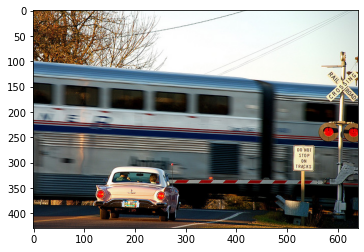

Greedy caption :: a train is traveling down a highway

------------------------------
Inferrring image 88 of 100:
/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_train2017_118k/000000492246.jpg

Ground Truth descriptions:
Orig Desc 1 :: a man with purple hair and braces laughing
Orig Desc 2 :: a person with a tie in a building.
Orig Desc 3 :: a woman with long, colored hair is smiling.
Orig Desc 4 :: a person with purple hair and and tie.
Orig Desc 5 :: the smiling woman wearing a tie has long blue hair.


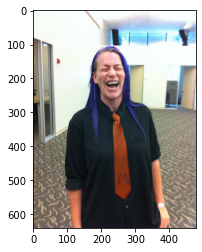

Greedy caption :: a man wearing a t shirt and a tie

------------------------------
Inferrring image 89 of 100:
/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_train2017_118k/000000492251.jpg

Ground Truth descriptions:
Orig Desc 1 :: a man flying through the air while riding a skateboard.
Orig Desc 2 :: a person jumping a skate board in the air
Orig Desc 3 :: a man performing a skateboard trick down some stairs.
Orig Desc 4 :: a boy going down steps on a skate board
Orig Desc 5 :: a guy on a longboard does tricks over concrete steps.


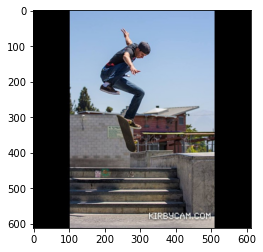

Greedy caption :: a man on a skateboard down a stair rail

------------------------------
Inferrring image 90 of 100:
/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_train2017_118k/000000492254.jpg

Ground Truth descriptions:
Orig Desc 1 :: clock with roman numerals atop a tower on a street corner.
Orig Desc 2 :: a black clock tower with a roman numeral face.
Orig Desc 3 :: a large outdoor clock with roman numerals standing under a tree.
Orig Desc 4 :: looking up at a lamp post clock on a city street
Orig Desc 5 :: the tower in town has a clock displayed on it. 


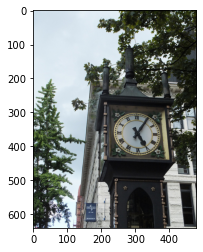

Greedy caption :: a clock on a building

------------------------------
Inferrring image 91 of 100:
/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_train2017_118k/000000492259.jpg

Ground Truth descriptions:
Orig Desc 1 :: a man running across a tennis court holding a tennis racquet.
Orig Desc 2 :: a man is cross legged trying to return a tennis ball.
Orig Desc 3 :: a man has style as he leans into a tennis swing.
Orig Desc 4 :: a man with a tennis racket running towards a ball on a a tennis court.
Orig Desc 5 :: a man running to hit a tennis ball.


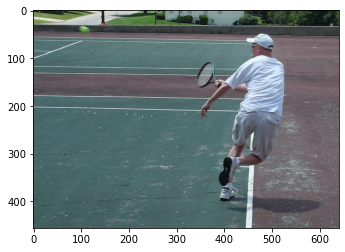

Greedy caption :: a man playing tennis on a tennis court

------------------------------
Inferrring image 92 of 100:
/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_train2017_118k/000000492261.jpg

Ground Truth descriptions:
Orig Desc 1 :: a skier is standing in a valley overlooking mountains under puffy grey clouds.
Orig Desc 2 :: a man riding across a snow covered ski slope.
Orig Desc 3 :: a man on red skis on a icy mountain look towards another mountain.
Orig Desc 4 :: a skier with a backpack pauses to enjoy the view
Orig Desc 5 :: a cross country skier taking in the views.


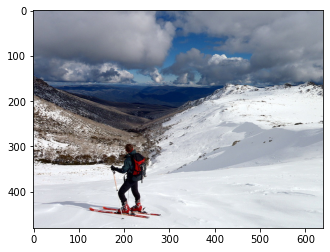

Greedy caption :: a man on skis down a snow covered slope

------------------------------
Inferrring image 93 of 100:
/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_train2017_118k/000000492266.jpg

Ground Truth descriptions:
Orig Desc 1 :: people jumping in the air on their snow boards at the ski slope. 
Orig Desc 2 :: a man flying through the air while riding on top of a snowboard.
Orig Desc 3 :: a photo on mountains skating wearing very warm clothes
Orig Desc 4 :: several snowboarders on their waydown hill making a jump.
Orig Desc 5 :: a man in four different photos jumping with his snowboard. 


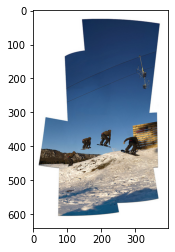

Greedy caption :: a group of people on a snowboard on a snowboard

------------------------------
Inferrring image 94 of 100:
/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_train2017_118k/000000492267.jpg

Ground Truth descriptions:
Orig Desc 1 :: a fire department vehicle is in the lot with other vehicles.
Orig Desc 2 :: a red hollywood fire department truck is parked in a space.
Orig Desc 3 :: the suv that belongs to the city fire chief in a parking lot.
Orig Desc 4 :: a red sports utility truck used by a fire department.
Orig Desc 5 :: a car in a parking lot with other cars


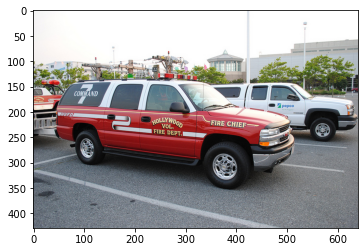

Greedy caption :: a truck with a freezer covered in the street

------------------------------
Inferrring image 95 of 100:
/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_train2017_118k/000000492268.jpg

Ground Truth descriptions:
Orig Desc 1 :: a lady in a canoe with fruits and her personal items
Orig Desc 2 :: a woman in a boat has several lemons.
Orig Desc 3 :: native woman in small boat with load of fruit near wall.
Orig Desc 4 :: there is a woman on a small boat with many fruits
Orig Desc 5 :: a woman in a hat sit on a boat of fruit 


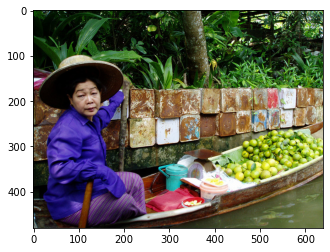

Greedy caption :: a man sitting on a bench with bananas

------------------------------
Inferrring image 96 of 100:
/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_train2017_118k/000000492271.jpg

Ground Truth descriptions:
Orig Desc 1 :: a man cutting greens over a pizza in a  box.
Orig Desc 2 :: the chef is cutting a green herb over the pizza.
Orig Desc 3 :: a chef cuts up vegetables over a pizza.
Orig Desc 4 :: a man cuts greens with a pair of scissors.
Orig Desc 5 :: a man cutting over a pizza that is in a box.


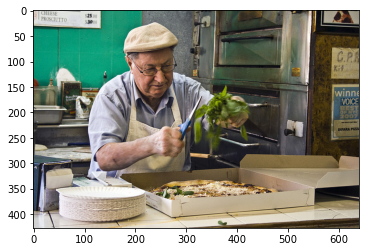

Greedy caption :: a man in a kitchen preparing a piece of food

------------------------------
Inferrring image 97 of 100:
/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_train2017_118k/000000492286.jpg

Ground Truth descriptions:
Orig Desc 1 :: a big train is about to leave and go away. 
Orig Desc 2 :: a train at a train station near a platform
Orig Desc 3 :: a passenger train that is pulling into a station.
Orig Desc 4 :: a red train that is sitting on the tracks.
Orig Desc 5 :: a train coming into the station as seen from the deck outside. 


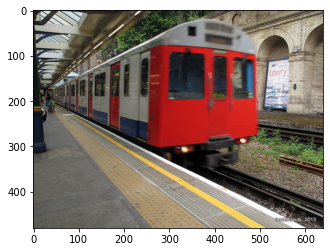

Greedy caption :: a train is parked at a station

------------------------------
Inferrring image 98 of 100:
/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_train2017_118k/000000492291.jpg

Ground Truth descriptions:
Orig Desc 1 :: an orange tree with one ripe orange on it.
Orig Desc 2 :: looks like a small lemon tree in the yard
Orig Desc 3 :: a tree with one orange on it in a yard.
Orig Desc 4 :: a single orange on a small orange tree.
Orig Desc 5 :: a tree in the middle of a yard with one large piece of fruit on it


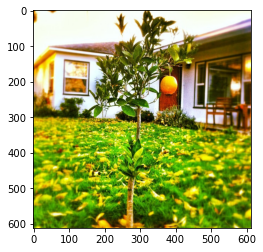

Greedy caption :: a tree with a tree in a flower pot

------------------------------
Inferrring image 99 of 100:
/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_train2017_118k/000000492292.jpg

Ground Truth descriptions:
Orig Desc 1 :: a bbq grill with hot dogs and buns on it.
Orig Desc 2 :: a bbq filled with hot dogs and buns outdoors.
Orig Desc 3 :: a barbeque grill with hot dogs and hot dog buns on it.
Orig Desc 4 :: hot dog buns and hot dogs lined up on a barbecue grill
Orig Desc 5 :: hot dogs and buns cooking on a grill.


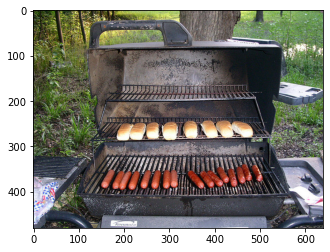

Greedy caption :: a grill with a pizza on top of it

------------------------------
Inferrring image 100 of 100:
/media/rohit/DATA/EverythingD/01SRHBDBA_Acads/Thesis/StoryGenerator/Data/COCO_train2017_118k/000000492293.jpg

Ground Truth descriptions:
Orig Desc 1 :: a small trolley like bus being followed by another.
Orig Desc 2 :: a blue and white bus traveling past  park.
Orig Desc 3 :: one red and one blue trolley waiting for passengers.
Orig Desc 4 :: a bus that runs on electricity from a contact with overhead lines.
Orig Desc 5 :: a bus is parked on the street in front of another bus.


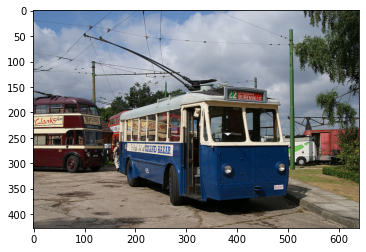

Greedy caption :: a bus is leaving a bus stop


In [64]:
count = 0
for k, v in comparison_dict_with_GT_reload.items():
    _ , gt_caps_arr = v
    count += 1
    if count > DEMO_IMGS_RUN_COUNT:
        break
    img_to_pred = DEMO_IMGS_DIR + k + r'.jpg'
    print(f"\n{'-' * 30}\nInferrring image {count} of {DEMO_IMGS_RUN_COUNT}:\n{img_to_pred}")
    print(f"\nGround Truth descriptions:")
    for idx, each_gt_desc in enumerate(gt_caps_arr):
        print(f"Orig Desc {idx+1} :: {each_gt_desc}")
    
    ## show the original image
    x = plt.imread(img_to_pred)
    plt.imshow(x)
    plt.show()
    
    ## get predicted caption via greedy search
    result, attention_plot = evaluate_my_greedy(img_to_pred)
    if result[-1] == '<end>':
        result = result[:-1]
    result = ' '.join(result[:])
    print(f"Greedy caption :: { result }")